In [1]:
##install necessary packages
!pip install -U -q PyDrive  ##-q hides output
!pip install -q requests --upgrade
!pip install -q urllib3 --upgrade  
!pip install -q spotipy --upgrade


     |████████████████████████████████| 62 kB 120 kB/s 
     |████████████████████████████████| 140 kB 5.1 MB/s 
     |████████████████████████████████| 248 kB 7.5 MB/s 


In [2]:
##import necessary libraries

import pandas as pd, numpy as np, matplotlib.pyplot as plt, seaborn as sns, plotly.express as px, os, spotipy, difflib
from yellowbrick.target import FeatureCorrelation
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

from spotipy.oauth2 import SpotifyClientCredentials
from collections import defaultdict

from collections import defaultdict
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist

In [4]:
##upload data from google drive

##Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

##get ids of data files in drive
data_id = '1te0x2ta9b1zHvr7e7Qc4oSIQxMtMc8Fe'          ##https://drive.google.com/file/d/1te0x2ta9b1zHvr7e7Qc4oSIQxMtMc8Fe/view?usp=sharing
w_genre_data_id = '1FflZ3E_BwGdyGiV09eko4NZKfWOZRx5R'  ##https://drive.google.com/file/d/1FflZ3E_BwGdyGiV09eko4NZKfWOZRx5R/view?usp=sharing
artist_data_id = '131StTpA41mgp8z3MKdH-c2jeCmWryVLm'   ##https://drive.google.com/file/d/131StTpA41mgp8z3MKdH-c2jeCmWryVLm/view?usp=sharing
year_data_id = '1gI2h4oWuiNSNkwsikkDVar8aZrv1Tsv9'     ##https://drive.google.com/file/d/1gI2h4oWuiNSNkwsikkDVar8aZrv1Tsv9/view?usp=sharing
genre_data_id = '1x1jRxkjwBAUaQjclQW03M2587QOJZS_7'    ##https://drive.google.com/file/d/1x1jRxkjwBAUaQjclQW03M2587QOJZS_7/view?usp=sharing

##convert files to dataframes
downloaded = drive.CreateFile({'id':data_id}) 
downloaded.GetContentFile('data.csv')
data = pd.read_csv('data.csv')

downloaded = drive.CreateFile({'id':w_genre_data_id}) 
downloaded.GetContentFile('w_genre_data.csv')  
w_genre_data = pd.read_csv('w_genre_data.csv')

downloaded = drive.CreateFile({'id':artist_data_id}) 
downloaded.GetContentFile('artist_data.csv')  
artist_data = pd.read_csv('artist_data.csv')

downloaded = drive.CreateFile({'id':year_data_id}) 
downloaded.GetContentFile('year_data.csv')  
year_data = pd.read_csv('year_data.csv')

downloaded = drive.CreateFile({'id':genre_data_id}) 
downloaded.GetContentFile('genre_data.csv')  
genre_data = pd.read_csv('genre_data.csv')

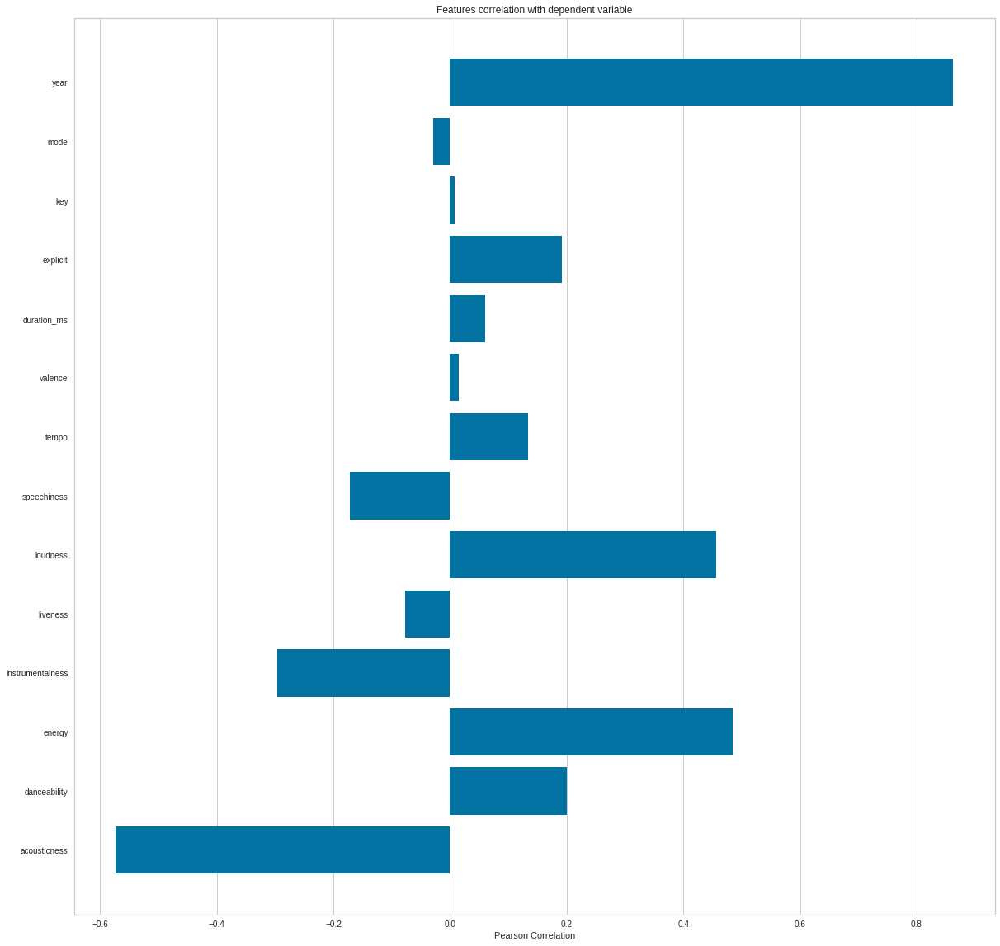

In [5]:
feature_names = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo', 'valence','duration_ms','explicit','key','mode','year']
X, y = data[feature_names], data['popularity']

##Create a list of the feature names
features = np.array(feature_names)

##Instantiate the visualizer
visualizer = FeatureCorrelation(labels=features)
plt.rcParams['figure.figsize']=(20,20)

##Fit the data to the visualizer
visualizer.fit(X, y)
visualizer.show()

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


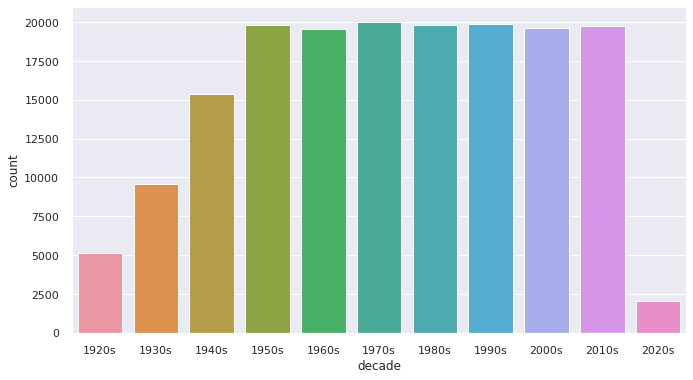

In [6]:
def get_decade(year):
    period_start = int(year/10) * 10
    decade = '{}s'.format(period_start)
    return decade

data['decade'] = data['year'].apply(get_decade)
sns.set(rc={'figure.figsize':(11 ,6)})
sns.countplot(data['decade'])

In [7]:
sound_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'valence']
fig = px.line(year_data, x='year', y=sound_features)
fig.show()

In [8]:
top10_genres = genre_data.nlargest(10, 'popularity')
fig = px.bar(top10_genres, x='genres', y=['valence', 'energy', 'danceability', 'acousticness'], barmode='group')
fig.show()

In [9]:
cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=10))])
X = genre_data.select_dtypes(np.number)
cluster_pipeline.fit(X)
genre_data['cluster'] = cluster_pipeline.predict(X)

tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])
genre_embedding = tsne_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genre_data['genres']
projection['cluster'] = genre_data['cluster']
fig = px.scatter(projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'])
fig.show()

/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.027s...
[t-SNE] Computed neighbors for 2973 samples in 0.494s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.114151
[t-SNE] KL divergence after 1000 iterations: 1.387394


In [10]:
song_cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=20, verbose=False))], verbose=False)
X = data.select_dtypes(np.number)
number_cols = list(X.columns)
song_cluster_pipeline.fit(X)
song_cluster_labels = song_cluster_pipeline.predict(X)
data['cluster_label'] = song_cluster_labels

pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
song_embedding = pca_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = data['name']
projection['cluster'] = data['cluster_label']
fig = px.scatter(projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()

In [11]:
%env SPOTIPY_CLIENT_ID = 091dbcfc9a344f5bb7b94187ebf511ec
%env SPOTIPY_CLIENT_SECRET = 14b10112f5eb47989d9b7a3ee6a0366f

scc = SpotifyClientCredentials(client_id=os.environ["SPOTIPY_CLIENT_ID"], client_secret=os.environ["SPOTIPY_CLIENT_SECRET"])
sp = spotipy.Spotify(auth_manager=scc)

def find_song(name, year):
    song_data = defaultdict()
    results = sp.search(q= 'track: {} year: {}'.format(name,year), limit=1)
    if results['tracks']['items'] == []: return None
    results = results['tracks']['items'][0]
    track_id = results['id']
    audio_features = sp.audio_features(track_id)[0]
    song_data['name'] = [name]
    song_data['year'] = [year]
    song_data['explicit'] = [int(results['explicit'])]
    song_data['duration_ms'] = [results['duration_ms']]
    song_data['popularity'] = [results['popularity']]
    for key, value in audio_features.items(): song_data[key] = value
    return pd.DataFrame(song_data)

env: SPOTIPY_CLIENT_ID=091dbcfc9a344f5bb7b94187ebf511ec
env: SPOTIPY_CLIENT_SECRET=14b10112f5eb47989d9b7a3ee6a0366f


In [12]:
cols = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit', 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo']

def get_song_data(song, spotify_data):
    try:
        song_data = spotify_data[(spotify_data['name'] == song['name']) & (spotify_data['year'] == song['year'])].iloc[0]
        return song_data
    except IndexError: return find_song(song['name'], song['year'])        

def get_mean_vector(song_list, spotify_data):
    song_vectors = []
    for song in song_list:
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print('Warning: {} does not exist in Spotify or in database'.format(song['name']))
            continue
        song_vector = song_data[cols].values
        song_vectors.append(song_vector)  
    song_matrix = np.array(list(song_vectors))
    return np.mean(song_matrix, axis=0)

def flatten_dict_list(dict_list):
    flattened_dict = defaultdict()
    for key in dict_list[0].keys(): flattened_dict[key] = []
    for dictionary in dict_list:
        for key, value in dictionary.items(): flattened_dict[key].append(value)
    return flattened_dict

def recommend_songs(song_list, spotify_data, n_songs=10):
    metadata_cols = ['name', 'year', 'artists']
    song_dict = flatten_dict_list(song_list)
    song_center = get_mean_vector(song_list, spotify_data)
    scaler = song_cluster_pipeline.steps[0][1]
    scaled_data = scaler.transform(spotify_data[cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))
    distances = cdist(scaled_song_center, scaled_data, 'cosine')
    index = list(np.argsort(distances)[:, :n_songs][0])
    rec_songs = spotify_data.iloc[index]
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])]
    return rec_songs[metadata_cols].to_dict(orient='records')

In [13]:
def get_input(msg, dtype, *assertions, err_msg=''):
  loop = True
  while(loop == True):
    try:
      value = dtype(input(msg))
      for assertion in assertions: assert assertion(value)
      loop = False
    except ValueError:
      print(err_msg)
      loop = True
    except AssertionError:
      print(err_msg)
  return value

num_songs = get_input('How many songs would you like to enter?: ', int, lambda x: x>0, err_msg='Invalid Entry: Please enter a positive integer')
num_recommendations = get_input('How many recommendations would you like to receive?: ', int, lambda x: x>0, err_msg='Invalid Entry: Please enter a positive integer')

songs = list()

for i in range(num_songs):
  name = get_input('Enter the name of song ' + str(i+1) + ': ', str)
  year = get_input('Enter the year of song ' + str(i+1) + ': ', int, lambda x: x>1920, err_msg='Invalid Entry: Please enter a year after 1920')
  num_artists = get_input('How many artists does song ' + str(i+1) + ' have?: ', int, lambda x: x>0, err_msg='Invalid Entry: Please enter a positive integer')
  artists = list()
  for j in range(num_artists): artists.append(get_input('Enter artist ' + str(j+1) + ' of song ' + str(i+1) + ': ', str))
  songs.append({'name' : name, 'year' : year, 'artists' : artists})
recommended_songs = recommend_songs(songs, data, n_songs=num_recommendations+1)
#recommendations = pd.DataFrame(recommended_songs)
#print(recommendations)
for song in recommended_songs: print(song)
  

KeyboardInterrupt: ignored